# Определение возраста покупателей

**Выполнил**: Юмаев Егор

## Введение

Сетевой супермаркет «Хлеб-Соль» внедряет систему компьютерного зрения для обработки фотографий покупателей. Фотофиксация в прикассовой зоне поможет определять возраст клиентов, чтобы:

 * анализировать покупки и предлагать товары, которые могут заинтересовать покупателей этой возрастной группы;

 * контролировать добросовестность кассиров при продаже алкоголя.

Для обучения модели в наличии имеется размеченный набор фотографий людей с указанием возраста.

**Цель** - построить модель, которая по фотографии определит приблизительный возраст человека.

Для достижения цели выполнены следующие **задачи**:

 * исследовательский анализ набора фотографий

 * подготовка данных для обучения нейросети

 * обучение нейросети
 
 * анализ качества обучения

Исходные данные взяты с сайта ChaLearn Looking at People (https://chalearnlap.cvc.uab.es/dataset/26/description/).

Целевая **метрика** обучения модели, – 'mean_absolute_error', – должна быть меньше 8.

В качестве **функции потерь** использована 'mean_squared_error'.

Решаемая в проекте задача является задачей **регрессии**.

## Исследовательский анализ данных. Подготовка данных для обучения нейросети

In [1]:
# импортируем необходимые библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams, rcParamsDefault
import seaborn as sns
from PIL import Image
from tensorflow import keras
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.layers import Conv2D, Flatten, Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras import metrics
PATH = '/datasets/faces/'

In [2]:
# настраиваем параметры отображения рисунков
rcParams['figure.figsize'] = 9,5
%config InlineBackend.figure_format = 'svg' 
%matplotlib inline
factor = 10
default_dpi = rcParamsDefault['figure.dpi']
rcParams['figure.dpi'] = default_dpi*factor

In [3]:
# подгружаем файлы с данными
try:
    labels = pd.read_csv(PATH + 'labels.csv')
    print('Datasets load from Practicum cloud')
    
except:
    labels = pd.read_csv('labels.csv')
    print('Datasets load from local storage')

Datasets load from local storage


In [4]:
# выведем размер датасета
labels.shape

(7591, 2)

Согласно техзадания решается задача регрессии для супермаркета с потенциально высокой проходимостью. Ошибка предсказаний модели должна быть как можно ниже, следовательно, модель должна быть хорошо обучена. Чем больше данных, тем лучше будет обучена модель. С высокой долей вероятности можно предположить, что 7591 наблюдение (фотография) – недостаточный массив для обучения модели. Т.к. расширить датасет путем добавления новых фотографий возможности нет, для расширения обучающего поля будет применена аугментация, – способ увеличения выборки изображений посредством добавления к уже имеющимся фотографиям эффекта горизонтального и вертикального отражения, добавления диапазона вращения, диапазона сдвига по высоте, диапазона сдвига по ширине. Таким образом, на основе одной исходной фотографии можно получить до пяти дополнительных и увеличить обучающее пространство в шесть раз.

In [5]:
# инициализируем загрузчик, 
# нормализуем размер цветов в каждом из трех каналов 
# (приводим значения в диапазон [0, 1])
datagen = ImageDataGenerator(rescale=1./255)

In [6]:
# с помощью загрузчика извлекаем данные из папки 
# посредством функции flow_from_dataframe
try:
    datagen_flow = datagen.flow_from_dataframe(
        dataframe=labels,
        directory = PATH + 'final_files/',
        x_col='file_name',
        y_col='real_age',
        target_size=(224, 224),
        batch_size=32,
        class_mode='raw',
        seed=12345)
    print('Images load from Practicum cloud')
    
except:
    datagen_flow = datagen.flow_from_dataframe(
        dataframe=labels,
        directory = 'I:\YANDEX\final_files',
        x_col='file_name',
        y_col='real_age',
        target_size=(224, 224),
        batch_size=32,
        class_mode='raw',
        seed=12345)
    print('Images load from local storage')

Found 0 validated image filenames.
Images load from Practicum cloud


C:\Users\Modern\anaconda3\envs\ds_practicum_env\lib\site-packages\keras_preprocessing\image\dataframe_iterator.py:279: UserWarning: Found 7591 invalid image filename(s) in x_col="file_name". These filename(s) will be ignored.
  warnings.warn(


In [7]:
# выведем первые пять строк датасета labels
labels.head()

,file_name,real_age
0,000000.jpg,4
1,000001.jpg,18
2,000002.jpg,80
3,000003.jpg,50
4,000004.jpg,17


Признак 'file_name' датасета labels содержит указания на фотографии людей, размещенные в директории (папке) '/datasets/faces/final_files/'. Признак 'real_age' содержит информацию о возрасте человека.

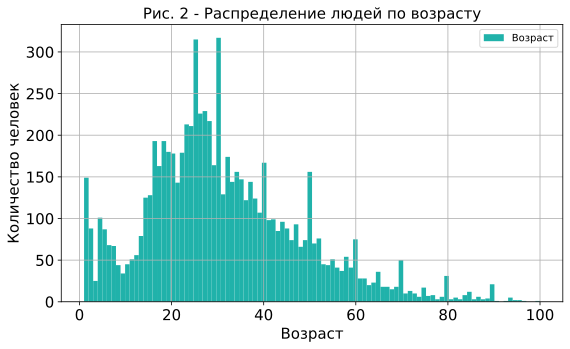

In [8]:
plt.figure(figsize = (9,5))
h = labels['real_age'].plot(
    kind = 'hist', bins = 100, label = 'Возраст',
    legend = True, grid = True, color = 'lightseagreen', 
    fontsize = 15
)
plt.title('Рис. 2 - Распределение людей по возрасту', fontsize = 15)
plt.xlabel('Возраст', fontsize = 15)
plt.ylabel('Количество человек', fontsize = 15)
plt.show()

Наибольшее количество фотографий из имеющегося в наличии датасета принадлежит людям в возрасте от 20 до 30 лет. Чем старше возраст, тем меньше фотографий людей соответствующего возраста есть в обучающем наборе. Для ряда возрастов с интервалом примерно в 10 лет прослеживается резкое увеличение количества фотографий в сравнении с 'соседним' возрастом, что, очевидно, связано с особенностями процедуры сбора фотографий. Чем старше возраст людей, тем меньше фотографий представлено в базе.

In [9]:
# изучим общую статистику признака с возрастом людей
labels.real_age.describe()

count    7591.000000
mean       31.201159
std        17.145060
min         1.000000
25%        20.000000
50%        29.000000
75%        41.000000
max       100.000000
Name: real_age, dtype: float64

Для обучения нейронной сети отобраны фотографии людей в возрасте от 1 года до 100 лет. Средний возраст людей, чьи фотографии представлены в обучающем наборе, составляет 31 год. Всего доступно 7591 фотографий.

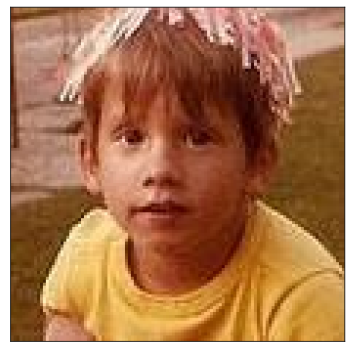

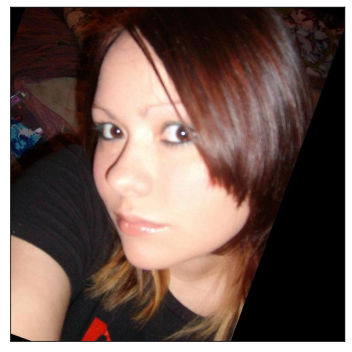

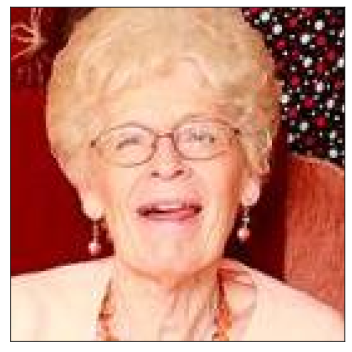

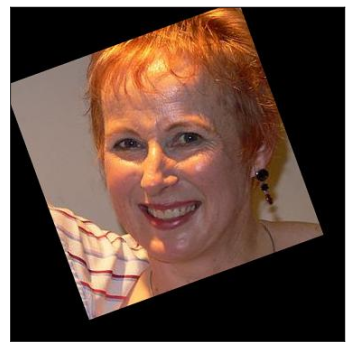

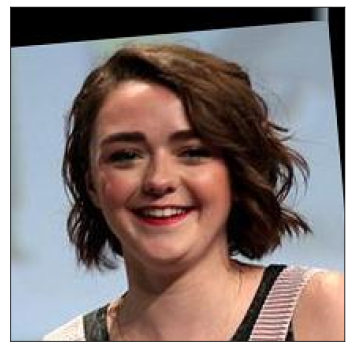

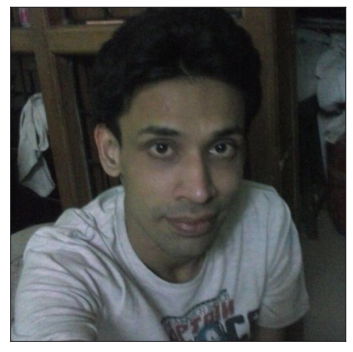

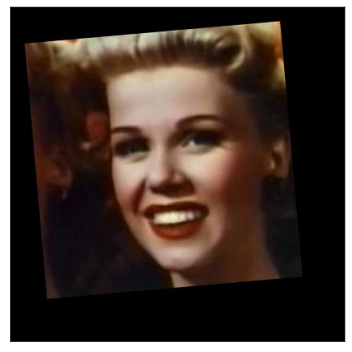

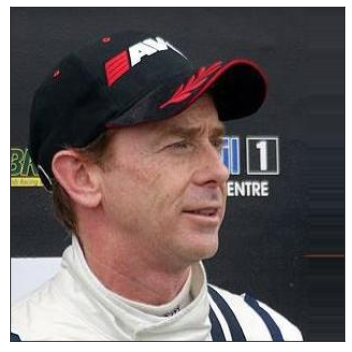

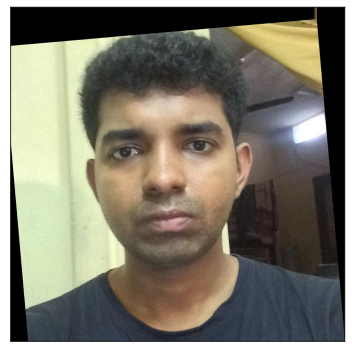

In [10]:
# выведем на экран первые девять фотогарфий
try:
    for i in range(9):
        image = Image.open(PATH + 'final_files/00000' + str(i) + '.jpg')
        plt.imshow(np.array(image))
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()
        plt.show()

except:
    for i in range(9):
        image = Image.open('final_files/00000' + str(i) + '.jpg')
        plt.imshow(np.array(image))
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()
        plt.show()

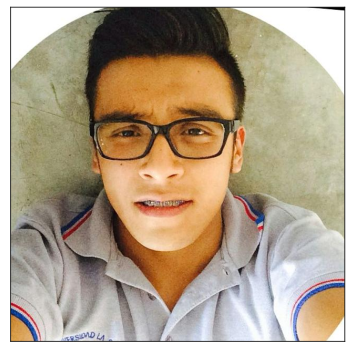

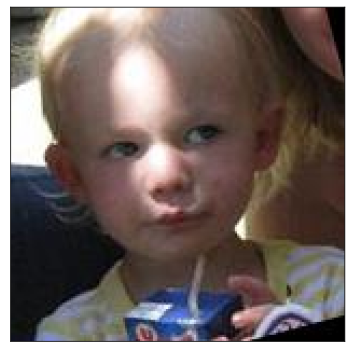

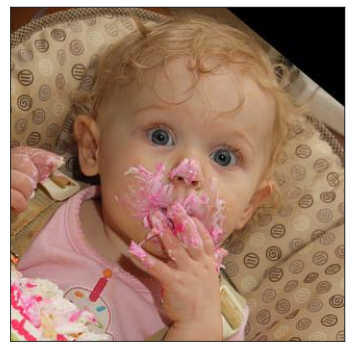

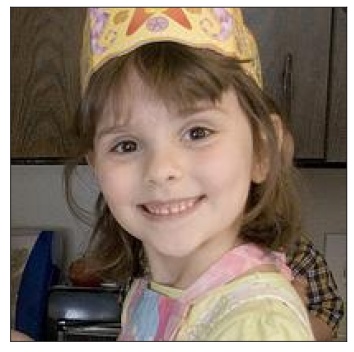

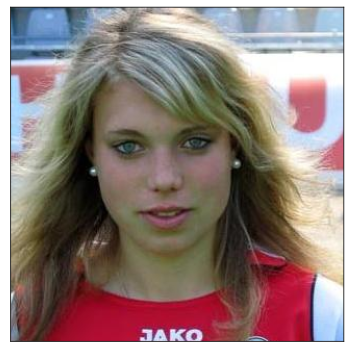

In [11]:
# выведем на экран еще семь фотографий
try:
    for i in range(7):
        image = Image.open(PATH + 'final_files/00001' + str(i) + '.jpg')
        plt.imshow(np.array(image))
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()
        plt.show()

except:
    for i in range(7):
        image = Image.open('final_files/00001' + str(i) + '.jpg')
        plt.imshow(np.array(image))
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()
        plt.show()

**Выводы к разделу 2 'Исследовательский анализ данных. Подготовка данных для обучения нейросети'**: 

 * датасет с фотографиями людей, размеченными по возрасту, загружен

 * данные нормализованы для передачи на обучение нейронной сети

 * исследовано распределение людей по возрасту, показавшее, что представлены фотографии людей в возрасте от 1 года до 100 лет; средний возраст людей, изображенных на фотографиях, составляет 31 год

 * для контроля загрузки датасета выведены 33 фотографии

 * датасет включает 7591 фотографию, что может быть недостаточно для обучения модели

 * исследование распределения целевого признака (‘real_age’) показывает наличие дисбаланса. Большая часть фотографий принадлежит  людям в возрасте 23-40 лет. Хорошо прослеживается резкое увеличение числа фотографий для «юбилейных возрастов» в сравнении с «соседними» возрастными группами. Например, отметим такие всплески для 15, 25, 30, 40, 50, 60, 70, 80, 90 лет. Вероятнее всего разметка была сделана недостаточно точно и во многих случаях возраст просто округлялся ближе к юбилейной дате

 * на рассмотренных фотографиях лица людей изображены крупным планом. Фотографии преимущественно цветные. На некоторых фотографиях присутствуют посторонние предметы, но это не препятствует идентификации изображенного лица. 

 * Некоторые фотографии имеют вид изображений, ранее прошедших аугментацию. Из рассмотренной выборки таких фотографий примерно 20%. Соответственно, для увеличения размера датасета с целью повышения качества обучения модели нейронной сети целесообразно применение стандартных приемов аугментации


## Обучение модели

In [12]:
# создаем функцию для загрузки обучающей выборки
def load_train(path):
    train_datagen = ImageDataGenerator(validation_split=0.25, 
        rescale=1/255, 
        horizontal_flip = True
)

    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=pd.read_csv(path + 'labels.csv'),
        directory=(path + '/final_files'),
        x_col='file_name',
        y_col='real_age',
        target_size=(224, 224),
        batch_size=32,
        class_mode='raw', 
        subset='training',
        seed=12345)

    return train_gen_flow

In [13]:
# создаем функцию для зарузки валидационной выборки
def load_test(path):
    validation_datagen = ImageDataGenerator(validation_split=0.25, 
        rescale=1/255)

    val_gen_flow = validation_datagen.flow_from_dataframe(
        dataframe=pd.read_csv(path + 'labels.csv'),
        directory=(path + '/final_files'),
        x_col='file_name',
        y_col='real_age',
        target_size=(224, 224),
        batch_size=32,
        class_mode='raw',
        subset='validation', 
        seed=12345)

    return val_gen_flow

In [14]:
# создаем функцию, формирующую модель обучения нейросети
def create_model(input_shape):
    optimizer = Adam(lr=0.0001)
    backbone = ResNet50(input_shape=input_shape,
                    weights='imagenet',
                    include_top=False)

    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())
    model.add(Dense(1, activation='relu'))

    model.compile(optimizer=optimizer, 
                  loss='mse',
                  metrics=['mae'])

    return model

In [15]:
# создадим функцию обучения модели
def train_model(model, train_data, test_data, batch_size=None, epochs=60,
                steps_per_epoch=None, validation_steps=None):

    features_train = train_data
    features_test = test_data
    model.fit(features_train, 
              validation_data=(features_test),
              batch_size=batch_size, epochs=epochs,
              steps_per_epoch=steps_per_epoch,
              validation_steps=validation_steps,
              verbose=2, shuffle=True)

    return model

Все вычисления были выполнены на сервере с графической картой (GPU) Yandex Compute Cloud.

Наилучшие гиперпараметры модели нейронной сети были выявлены в несколько этапов. На **первом отборочном этапе** оценивалось влияние аугментации на метрику ‘mean_absolute_error’. Начальная схема аугментации предполагала применение пяти подходов расширения обучающей выборки одновременно: 

1. horizontal_flip = True, 
2. vertical_flip = True, 
3. rotation_range = 90, 
4. width_shift_range = 0.2, 
5. height_shift_range = 0.2

Соответственно при самом первом экспериментальном запуске функция загрузки тренировочного (обучающего) датасета выглядела следующим образом:

In [16]:
# def load_train(path):
#     train_datagen = ImageDataGenerator(validation_split=0.25, 
#         rescale=1/255, 
#         horizontal_flip = True, 
#         vertical_flip = True, 
#         rotation_range = 90, 
#         width_shift_range = 0.2, 
#         height_shift_range = 0.2
# )

#     train_gen_flow = train_datagen.flow_from_dataframe(
#         dataframe=pd.read_csv(path + 'labels.csv'),
#         directory=(path + '/final_files'),
#         x_col='file_name',
#         y_col='real_age',
#         target_size=(224, 224),
#         batch_size=32,
#         class_mode='raw', 
#         subset='training',
#         seed=12345)

#     return train_gen_flow

Следом было проведено еще девять экспериментальных запусков с разными комбинациями аугментации на основе выше обозначенной схемы. 

Все экспериментальыне запуски были проведены с параметрами:
 * epochs = 10
 * lr = 0.00005
 * activation = 'relu'

Результаты **первого отборочного этапа** представлены в таблице.

In [17]:
first_stage_results = pd.DataFrame(
    {'1': ['Аугментация 1, 2, 3, 4, 5', 7.5622],
     '2': ['Аугментация 1, 2, 3, 4', 7.2047],
     '3': ['Аугментация 1, 2, 3', 6.8953], 
     '4': ['Аугментация 1, 2', 7.2883],
     '5': ['Аугментация 1', 6.0435],
     '6': ['Аугментация 2', 6.9402], 
     '7': ['Аугментация 3', 7.3666], 
     '8': ['Аугментация 4', 6.4112], 
     '9': ['Аугментация 5', 6.2744], 
     '10': ['Без аугментации', 6.6204]
    }
)

first_stage_results = first_stage_results.T
first_stage_results.columns = ['Примененная аугментация', 
                               'MAE']
first_stage_results = \
    first_stage_results \
    .sort_values(by = 'MAE') \
    .reset_index(drop = True)
first_stage_results

,Примененная аугментация,MAE
0,Аугментация 1,6.0435
1,Аугментация 5,6.2744
2,Аугментация 4,6.4112
3,Без аугментации,6.6204
4,"Аугментация 1, 2, 3",6.8953
5,Аугментация 2,6.9402
6,"Аугментация 1, 2, 3, 4",7.2047
7,"Аугментация 1, 2",7.2883
8,Аугментация 3,7.3666
9,"Аугментация 1, 2, 3, 4, 5",7.5622


Лучшее значение метрики mean_absolute_error получено при **горизонтальном отражении (horizontal_flip)**. Величина mae = 6.0435. 

На **втором отборочном этапе** было проверено влияние на значение метрики mean_absolute_error алгоритма активации. Алгоритм ‘relu’ был алгоритмом по умолчанию на первом отборочном этапе, поэтому он в экспериментах не участвовал. 

Неизменными гиперпараметрами **второго отборочного этапа** являются:

 * epochs = 10

 * lr = 0.00005

 * horizontal_flip = True

Было проведено семь экспериментальных запусков. Результаты представлены в таблице.

In [18]:
second_stage_results = pd.DataFrame(
    {'1': ['tanh', 28.6162],
     '2': ['sigmoid', 28.6163],
     '3': ['elu', 6.2473], 
     '4': ['selu', 6.0982],
     '5': ['softplus', 6.1188],
     '6': ['softsigh', 28.6392], 
     '7': ['softmax', 28.6162], 
     '8': ['relu', 6.0435]
     }
)

second_stage_results = second_stage_results.T
second_stage_results.columns = ['Алгоритм активации', 
                               'MAE']
second_stage_results = \
    second_stage_results \
    .sort_values(by = 'MAE') \
    .reset_index(drop = True)
second_stage_results

,Алгоритм активации,MAE
0,relu,6.0435
1,selu,6.0982
2,softplus,6.1188
3,elu,6.2473
4,tanh,28.6162
5,softmax,28.6162
6,sigmoid,28.6163
7,softsigh,28.6392


На **втором отборочном этапе** лучшее значение достигнуто при использовании алгоритма активации 'selu'. Но необходимо помнить, что на **первом отборочном этапе** лучшее значение метрики mean_absolute_error при использовании **алгоритма активации 'relu'** составило 6.0435, что на 0,0547 меньше, чем значение метрики при алгоритме активации 'selu'. Следовательно, на **втором отборочном этапе** лучшим гиперпараметром стал алгоритм активации 'relu'. Значение метрики mean_absolute_error = 6.0435 было получено на предыдущем (первом) этапе.

Мы видим, что при использовании четырех алгоритмов активации ('tanh', 'softmax', 'sigmoid', 'softsign') получено значение ошибки mean_absolute_error более чем в четыре раза выше, чем при применении первых четырех алгоритмов активации. Это означает, что указанные алгоритмы активации не применимы к этой конкретной задаче.

На **третьем отборочном этапе** подобран гиперпараметр скорости обучения (‘learning_rate’, lr). Неизменяемыми гиперпараметрами этого этапа являются:

 * epochs = 10

 * activation = ‘relu’

 * horizontal_flip = True

Результаты экспериментальных запусков представлены в таблице.

In [19]:
third_stage_results = pd.DataFrame(
    {'1': [0.000001, 11.9105],
     '2': [0.00001, 6.8186],
     '3': [0.0001, 5.8943], 
     '4': [0.0002, 6.2541],
     '5': [0.0003, 6.5562],
     '6': [0.0004, 7.0627], 
     '7': [0.0005, 6.8214], 
     '8': [0.001, 7.6287], 
     '9': [0.01, 12.4688]
     }
)

third_stage_results = third_stage_results.T
third_stage_results.columns = ['learning rate', 
                               'MAE']
third_stage_results = \
    third_stage_results \
    .sort_values(by = 'MAE') \
    .reset_index(drop = True)
third_stage_results

,learning rate,MAE
0,0.000100,5.8943
1,0.000200,6.2541
2,0.000300,6.5562
3,0.000010,6.8186
4,0.000500,6.8214
5,0.000400,7.0627
6,0.001000,7.6287
7,0.000001,11.9105
8,0.010000,12.4688


Лучший результат достигнут при значении гиперпараметра **learning_rate = 0.0001**

На **четвертом отборочном этапе** подобран гиперпараметр количества эпох (‘epochs’). Неизменяемыми гиперпараметрами этого этапа являются:

 * activation = ‘relu’

 * horizontal_flip = True

 * learning_rate = 0.0001

Результаты экспериментальных запусков представлены в таблице.

In [20]:
fourth_stage_results = pd.DataFrame(
    {'1': ['10', 6.5797],
     '2': ['15', 6.1689],
     '3': ['20', 5.9619], 
     '4': ['25', 5.8340],
     '5': ['30', 5.7861],
     '6': ['35', 5.4580], 
     '7': ['40', 5.5691], 
     '8': ['45', 5.5286], 
     '9': ['50', 5.4574], 
     '10': ['60', 5.3389], 
     '11': ['70', 5.3755], 
     '12': ['80', 5.7956], 
     '13': ['90', 5.3974], 
     '14': ['100', 5.3868]
    }
)

fourth_stage_results = fourth_stage_results.T
fourth_stage_results.columns = ['Количество эпох', 
                               'MAE']
fourth_stage_results = \
    fourth_stage_results \
    .sort_values(by = 'MAE') \
    .reset_index(drop = True)
fourth_stage_results

,Количество эпох,MAE
0,60,5.3389
1,70,5.3755
2,100,5.3868
3,90,5.3974
4,50,5.4574
5,35,5.458
6,45,5.5286
7,40,5.5691
8,30,5.7861
9,80,5.7956


Визуализируем полученный результат. На первом рисунке изобразим те экспериментальные запуски, при которых удалось выполнить ограничение по значению mean_absolute_error < 8 и выделим лучший запуск в зависимости от количества эпох. По итогам **четвертого отборочного этапа** определены **гиперпараметры лучшего запуска модели нейронной сети**:

 * epochs = 60
 
 * activation = 'relu'
 
 * horisontal_flip = True
 
 * learning_rate = 0.0001

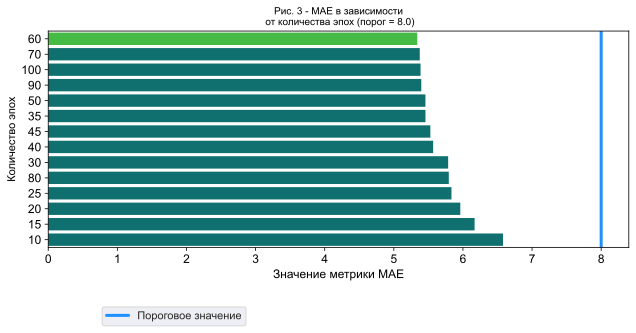

In [21]:
bar_values = fourth_stage_results['MAE']
bar_color = ['limegreen' \
    if (x == min(bar_values)) else 'teal' for x in bar_values]

c = sns.barplot(data = fourth_stage_results, 
    x = 'MAE', 
    y = 'Количество эпох', 
    palette = bar_color)
sns.set(rc={'figure.figsize':(6,5)})
c.axes.set_title('Рис. 3 - MAE в зависимости\n от количества эпох (порог = 8.0)',fontsize=10)
c.set_xlabel('Значение метрики MAE',fontsize=12)
c.set_ylabel('Количество эпох',fontsize=11)
c.tick_params(labelsize=12)
plt.axvline(8, linewidth = 3, 
            label = 'Пороговое значение',
            color = 'dodgerblue')
plt.legend()
plt.legend(bbox_to_anchor=(0.35, -0.25), loc="best")
plt.tight_layout()
plt.show()

В авторитетной научной статье:

* Apparent and real age estimation in still images with deep residual regressors on APPA-REAL database / Agustsson E. et al. // FG 2017 - 12th IEEE International Conference on Automatic Face and Gesture Recognition, May 2017, Washington DC, United States. pp.1-12. hal-01677892. – URL: https://hal.inria.fr/hal-01677892/document (accessed: 06.03.2023)

представлены результаты обучения модели нейронной сети на том же датасете, который применен для достижения цели настоящего проекта. Группе исследователей удалось добиться значения метрики MAE в 5.426. 

На четвертом отборочном этапе неоднократно было получено значение метрики MAE ниже, чем было указано в результатах научной статьи.

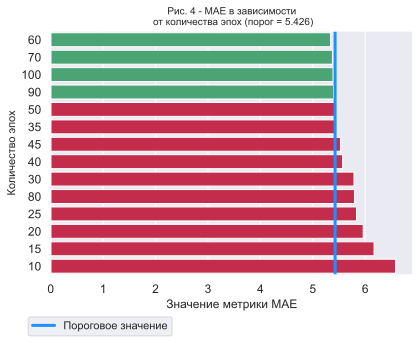

In [22]:
bar_values = fourth_stage_results['MAE']
bar_color = ['mediumseagreen' if (x < 5.426) else 'crimson' for x in bar_values]

c = sns.barplot(data = fourth_stage_results, 
    x = 'MAE', 
    y = 'Количество эпох', 
    palette = bar_color)
sns.set(rc={'figure.figsize':(6,5)})
c.axes.set_title('Рис. 4 - MAE в зависимости\n от количества эпох (порог = 5.426)',fontsize=10)
c.set_xlabel('Значение метрики MAE',fontsize=12)
c.set_ylabel('Количество эпох',fontsize=11)
c.tick_params(labelsize=12)
plt.axvline(5.426, linewidth = 3, 
            label = 'Пороговое значение',
            color = 'dodgerblue')
plt.legend()
plt.legend(bbox_to_anchor=(0.35, -0.15), loc="best")
plt.tight_layout()
plt.show()

При обучении модели нейронной сети на GPU получен следующий результат:

**Выводы к разделу 3 'Обучение модели'**:

**(1)** для обучения модели созданы четыре вспомогательные функции:

 * загрузки обучающей выборки

 * загрузки валидационной выборки

 * создания модели

 * собственно обучения модели

Применено семейство архитектуры ResNet, являющегося самым востребованным решением в задачах компьютерного зрения. В модели использована сеть ResNet50. Для снижения значения метрики mean_absolute_error применен алгоритм оптимизации Adam.

**(2)** для определения гиперпараметров запуска с лучшим (наименьшим) значением метрики mean_absolute_error проведено четыре отборочных этапа, на каждом из которых последвоательно отобраны гиперпараметры:

 * аугментация

 * алгоритм активации (‘actibation’)

 * шаг обучения (‘learning_rate’)

 * количество эпох (‘epochs’)

**(3)** по итогам четырех отборочных этапов определены **гиперпараметры лучшего запуска модели нейронной сети**, на котором получено значение метрики **mean_absolute_error = 5.3389**:

* horisontal_flip = True

* activation = 'relu'

* learning_rate = 0.0001

* epochs = 60

**(4)** на итоговом четвертом отборочном этапе выявления лучших гиперпараметров модели нейронной сети при horizontal_flip = True, activation = ‘relu’, learning_rate = 0.0001 и количестве эпох (epochs) соответственно 60, 70, 100, 90 получено значение метрики mean_absolute_error **ниже** чем на том же самом датасете в научной статье ‘Apparent and real age estimation in still images with deep residual regressors on APPA-REAL database’ (https://hal.inria.fr/hal-01677892/document) 

## Анализ обученной модели

**Выводы по итогам выполнения проекта**:

**(1)** в результате выполнения проекта построена модель нейронной сети, которая по фотографии определяет приблизительный возраст людей. Для обучения модели нейронной сети подготовлены функции, обеспечивающие загрузку обучающего и тестового комплектов, создание модели нейронной сети, обучение нейронной сети

**(2)** Для обучения был использован датасет, включающий 7591 фотографию людей в возрасте от 1 года до 100 лет. Наибольшее количество фотографий из имеющегося в наличии датасета принадлежит людям в возрасте от 20 до 30 лет. Чем старше возраст, тем меньше фотографий людей соответствующего возраста есть в обучающем наборе. Для ряда возрастов с интервалом примерно в 10 лет (для юбилейных возрастов) прослеживается резкое увеличение количества фотографий в сравнении с 'соседним' возрастом, что, очевидно, связано с особенностями процедуры сбора фотографий и недостаточно качественной разметкой. Чем старше возраст людей, тем меньше фотографий представлено в базе

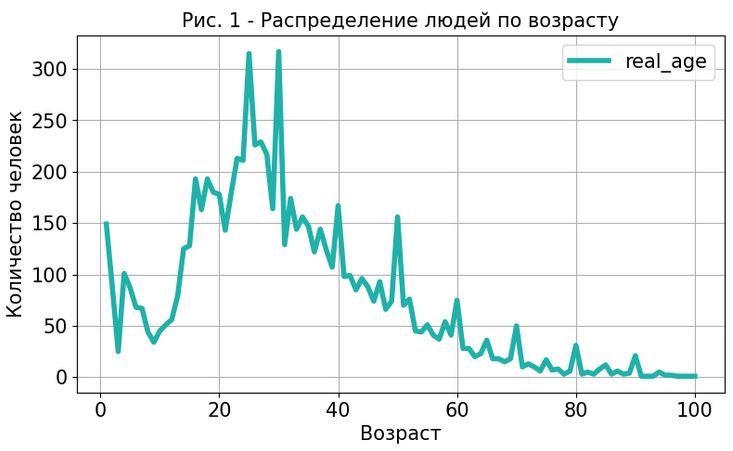

**(3)** для решения задачи определения приблизительного возраста людей применена нейронная сеть, в частности принадлежащая к семейству архитектур ResNet сеть ResNet50. В архитектуре ResNet используются Shortcut Connections – дополнительные связи внутри сети, которые позволяют избежать проблемы затухающего градиента. С целью повышения качества обучения модели при компиляции модели применен алгоритм оптимизации Adam

**(4)** проведен последовательный четырехэтапный отбор гиперпараметров лучшего запуска модели нейронной сети, на каждом из которых три гиперпараметра имели фиксированные значения, значения четвертого варьировались. Установлено:

 * лучшие значения метрики MAE получены при раздельном применении агументаций **horizontal_flip (6.0435)**, height_shift_range (6.2744), width_shift_range (6.4112)

 * лучшие значения метрики MAE получены при применении алгоритма активации **‘relu’ (6.0435)**, ‘selu’ (6.0982), ‘softplus’ (6.1188)

 * лучшие значения метрики MAE получены при шагах обучения (learning_rate), равных **0.0001 (5.8943)**, 0.0002 (6.2541), 0.0003 (6.5562)

 * лучшие значения метрики MAE получены при количестве эпох **60 (5.3389)**, 70 (5.3755), 100 (5.3868). Самая высокая ошибка наблюдается при небольшом количестве эпох (10, 15, 20, 25)

Таким образом, выявлены гиперпараметры лучшего запуска модели нейронной сети:

* horisontal_flip = True

* activation = 'relu'

* learning_rate = 0.0001

* epochs = 60

**(5)** результаты четвертого этапа отбора лучших гиперпараметров представлены в таблице:

In [23]:
fourth_stage_results

,Количество эпох,MAE
0,60,5.3389
1,70,5.3755
2,100,5.3868
3,90,5.3974
4,50,5.4574
5,35,5.458
6,45,5.5286
7,40,5.5691
8,30,5.7861
9,80,5.7956


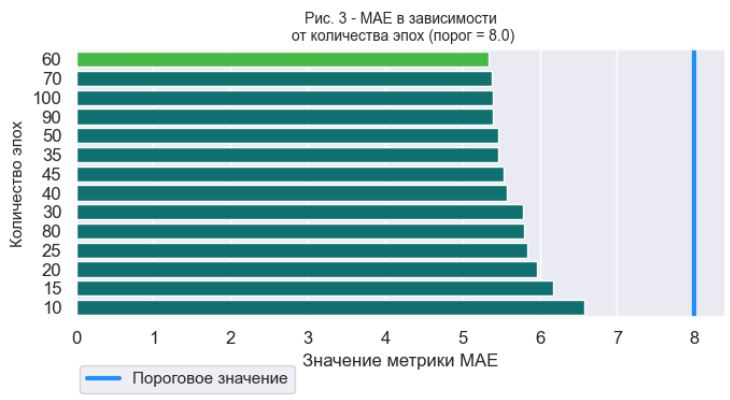

**(6)** лучшее значение метрики МАЕ = 5.3389 и соответствует целевому ограничению MAE < 8.0

**(7)** по итогам выполнения проекта удалось улучшить результат, полученный на том же самом датасете и описанный в авторитетной научной статье 'Apparent and real age estimation in still images with deep residual regressors on APPA-REAL database' (https://hal.inria.fr/hal-01677892/document): на четырех экспериментальных запусках при количестве эпох 60, 70, 100, 90 получено значение MAE меньше, чем 5.426

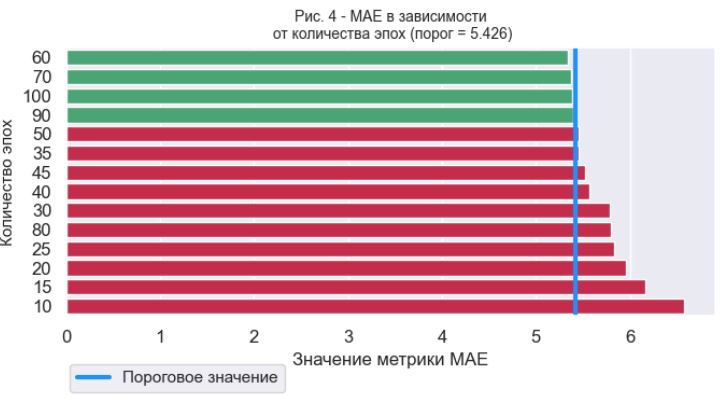